## Wikipedia Views

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sovai as sov
sov.token_auth(token="your_token_here")

#### Processed Dataset

In [3]:
df_wiki = sov.data("wikipedia/views", start_date="2017-03-30", tickers=['IBM', 'BRK.A', 'TM', 'F', 'BMWYY', 'WMT', 'DIS', 'MSFT', 'WWE', 'GOOGL'])

An easy way to isolate a ticker

In [4]:
df_wiki.ticker("IBM")

views  relative_views  alpha_short  beta_short  \
ticker date                                                           
IBM    2017-03-30 5885.000           0.997        0.612       0.620   
       2017-03-31 5114.000           0.997        0.615       0.618   
       2017-04-01 3905.000           0.997        0.613       0.470   
       2017-04-02 4393.000           0.997        0.622       0.633   
       2017-04-03 5781.000           0.997        0.623       0.634   
...                    ...             ...          ...         ...   
       2024-08-08 3932.000           0.993        0.512       0.573   
       2024-08-09 3530.000           0.993        0.512       0.551   
       2024-08-10 3184.000           0.993        0.538       0.568   
       2024-08-11 3245.000           0.992        0.538       0.524   
       2024-08-12 4196.000           0.993        0.566       0.458   

                   alpha_long  beta_long  long_short_alpha  long_short_beta  \
ticker date                                                                   
IBM    2017-03-30       0.469      0.624             0.284            0.499   
       2017-03-31       0.469      0.612             0.286            0.446   
       2017-04-01       0.468      0.602             0.286            0.850   
       2017-04-02       0.475      0.629             0.284            0.446   
       2017-04-03       0.603      0.625             0.437            0.437   
...                       ...        ...               ...              ...   
       2024-08-08       0.534      0.549             0.558            0.425   
       2024-08-09       0.536      0.534             0.564            0.462   
       2024-08-10       0.534      0.550             0.530            0.464   
       2024-08-11       0.533      0.530             0.532            0.558   
       2024-08-12       0.531      0.501             0.481            0.687   

                   search_pressure  
ticker date                         
IBM    2017-03-30            0.518  
       2017-03-31            0.513  
       2017-04-01            0.506  
       2017-04-02            0.504  
       2017-04-03            0.510  
...                            ...  
       2024-08-08            0.472  
       2024-08-09            0.473  
       2024-08-10            0.475  
       2024-08-11            0.475  
       2024-08-12            0.475  

[2693 rows x 9 columns]

An easy way to get a date range

In [6]:
df_wiki.date("2023-03-30", "2024-05-04")

views  relative_views  alpha_short  beta_short  \
ticker date                                                            
BMWYY  2023-03-30  4994.000           0.990        0.474       0.538   
       2023-03-31  4931.000           0.991        0.508       0.584   
       2023-04-01  4592.000           0.991        0.533       0.642   
       2023-04-02  4682.000           0.991        0.547       0.613   
       2023-04-03  4606.000           0.992        0.563       0.615   
...                     ...             ...          ...         ...   
WWE    2024-04-30 11543.000           0.999        0.518       0.562   
       2024-05-01 10694.000           0.999        0.519       0.562   
       2024-05-02 11393.000           0.998        0.516       0.517   
       2024-05-03 10975.000           0.998        0.516       0.542   
       2024-05-04 14192.000           0.998        0.521       0.557   

                   alpha_long  beta_long  long_short_alpha  long_short_beta  \
ticker date                                                                   
BMWYY  2023-03-30       0.551      0.495             0.619            0.395   
       2023-03-31       0.552      0.539             0.572            0.384   
       2023-04-01       0.554      0.584             0.545            0.342   
       2023-04-02       0.551      0.591             0.526            0.430   
       2023-04-03       0.553      0.591             0.513            0.421   
...                       ...        ...               ...              ...   
WWE    2024-04-30       0.609      0.557             0.651            0.517   
       2024-05-01       0.609      0.554             0.656            0.505   
       2024-05-02       0.604      0.540             0.655            0.628   
       2024-05-03       0.598      0.541             0.645            0.551   
       2024-05-04       0.597      0.546             0.639            0.496   

                   search_pressure  
ticker date                         
BMWYY  2023-03-30            0.479  
       2023-03-31            0.480  
       2023-04-01            0.484  
       2023-04-02            0.487  
       2023-04-03            0.490  
...                            ...  
WWE    2024-04-30            0.515  
       2024-05-01            0.515  
       2024-05-02            0.515  
       2024-05-03            0.514  
       2024-05-04            0.514  

[4020 rows x 9 columns]

Grabbing all the data (takes 2 mins)

In [12]:
df_wiki = sov.data("wikipedia/views", start_date="2015-03-30")

In [7]:
df_wiki_plot = df_wiki.reset_index()
# df_wiki_plot = df_wiki_plot[df_wiki_plot["date"]>"2023-03-30"]

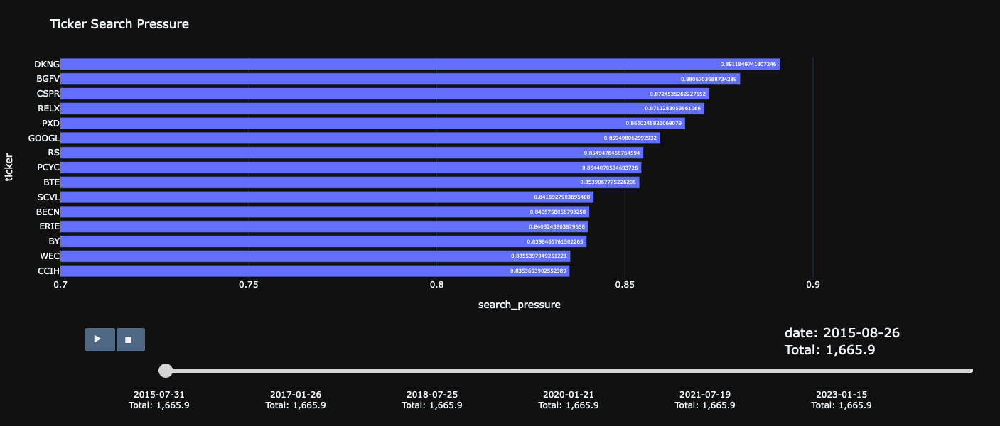

In [10]:
import pandas as pd
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
# import adviz

# %% ../nbs/03_racing_chart.ipynb 4
def racing_chart(
    df,
    n=10,
    title="Racing Chart",
    frame_duration=500,
    theme='none',
    width=None,
    height=600,
    font_size=12):
    """
    Create a racing bar chart showing the top `n` values for each period.

    Parameters
    ----------
    df : pandas.DataFrame
      A DataFrame containing three columns for entity, metric, and period. The
      names can be anything bu they have to be in this specific order.
    n : int
      The number of top items to display for each period.
    title : str
      The title of the chart.
    frame_duration : int
      The duration of each frame during animation, before transitioning to the
      following frame, in milliseconds.
    theme : str
      The theme of the chart. Any of the following values can be used:
    width : int
      The width of the chart in pixels.
    height : int
      The height of the chart in pixels.
    font_size : int
      The size of the fonts in the chart.

    Returns
    -------
    racing_barchart : plotly.graph_objects.Figure
    """
    period_totals = df.groupby(df.columns[2]).sum(df.columns[1]).reset_index()
    # df[f'{df.columns[1]} %'] = df.groupby(df.columns[2])[df.columns[1]].transform(lambda x: x / x.sum())
    top_n_df = (df
        .sort_values([df.columns[2], df.columns[1]],
                     ascending=[True, False])
        .groupby(df.columns[2])
        .head(n))
    fig = px.bar(
        top_n_df,
        x=df.columns[1],
        y=df.columns[0],
        text=df.columns[1],
        animation_frame=df.columns[2],
        hover_name=df.columns[0],
        height=height,
        width=width,
        title=title,
        template=theme,
        range_x=[0,top_n_df[df.columns[1]].max() * 1.05],
    )
    fig.layout.yaxis.autorange = 'reversed'
    fig.layout.font.size = font_size
    fig.layout.sliders[0].currentvalue.xanchor = 'right'
    fig.layout.sliders[0].currentvalue.prefix = fig.layout.sliders[0].currentvalue.prefix.replace('=', ': ')
    fig.layout.sliders[0].currentvalue.font.size = font_size * 1.5
    fig.layout.sliders[0].bgcolor = '#D5D5D5'
    fig.layout.sliders[0].borderwidth = 0
    fig.layout.updatemenus[0]['buttons'][0]['args'][1]['frame']['duration'] = frame_duration
    for step, total in zip(fig.layout.sliders[0].steps, period_totals.iloc[:, 1]):
        step['label'] = f"{step['label']}<br>Total: {total:,}"
    return fig
# Ensure 'date' is in datetime format
df_wiki_plot['date'] = pd.to_datetime(df_wiki_plot['date'])

# Convert 'date' to string format
df_wiki_plot['date'] = df_wiki_plot['date'].astype(str)

# Create the racing chart
fig = racing_chart(
    df_wiki_plot[['ticker', 'search_pressure', 'date']],
    title='Ticker Search Pressure',
    theme='plotly_dark',
    n=15,
    frame_duration=100,
    # height=600,
    width=1400
)

# Adjust layout properties
fig.layout.margin.l = 30
fig.layout.margin.r = 30
fig.layout.margin.t = 80
fig.layout.font.size = 12
fig.layout.xaxis.tickfont.size = 12
fig.layout.yaxis.tickfont.size = 12

# Set the x-axis range to start at 0.5
fig.layout.xaxis.range = [0.7, fig.layout.xaxis.range[1]]

fig

In [4]:
import pandas as pd
import polars as pl
from great_tables import GT, nanoplot_options

# Assuming df_wiki_plot is your pandas DataFrame loaded with data similar to the examples provided

# Filter the DataFrame for the top 10 tickers
top_tickers = ['KOPN', 'FBC', 'GLT', 'APPF', 'ELIO', 'KPELY', 'SMCI', 'SFIX', 'RITM', 'NYCB']
filtered_df = df_wiki_plot[df_wiki_plot['ticker'].isin(top_tickers)]

# Sort the DataFrame by ticker and date to ensure correct ordering
filtered_df = filtered_df.sort_values(by=['ticker', 'date'])

# Group by ticker, and then apply the transformation to get the last 60 'search_pressure' values
result = filtered_df.groupby('ticker').apply(
    lambda x: ' '.join(x.tail(60)['search_pressure'].astype(str))
).reset_index(name='numbers')

# Additional columns formatting
additional_cols = filtered_df.groupby('ticker').apply(
    lambda x: x.tail(60)[['views', 'relative_views','search_pressure','long_short_alpha','long_short_beta']].mean()
).reset_index()

# Merge results and additional_cols
final_result = result.merge(additional_cols, on='ticker', how='left')

# Convert the pandas DataFrame to Polars DataFrame
df_polars = pl.from_pandas(final_result)

# Format the table using great_tables
formatted_table = (
    GT(df_polars)
    .tab_header(title="Ticker Analysis Over Last 60 Days")
    .tab_options(
    # table_background_color="darkgrey",
    # heading_background_color="lightgrey"
    )
    .fmt_number(columns=["views", "relative_views", "search_pressure",'long_short_alpha','long_short_beta'], decimals=3)
    .cols_align(columns=["views", "relative_views", 'search_pressure','long_short_alpha','long_short_beta'], align="center")
    .data_color(
        columns=['search_pressure'],
        palette=["#333333", "#2171b5"],  # Darker to lighter blue suitable for dark backgrounds
        domain=[0, 1],
        na_color="#444444"  # Slightly lighter than the background for NA values
    )
    .data_color(
        columns=["ticker", "views", "relative_views", "search_pressure"],
        palette=["#333333", "#2171b5"],  # Darker to lighter blue suitable for dark backgrounds
        domain=[0, 1],
        na_color="#444444"  # Slightly lighter than the background for NA values
    )
    # .data_color(
    #     columns=["numbers"],
    #     palette=["blue", "blue"],  # Darker to lighter blue suitable for dark backgrounds
    #     domain=[0, 1],
    #     na_color="blue"  # Slightly lighter than the background for NA values
    # )
    .fmt_nanoplot(
        columns="numbers",
        # plot_type="line",
        # plot_height="30px",
        # plot_length="120px",
        
        # autoscale=True,
        options=nanoplot_options(
            data_point_radius=2,
            data_point_fill_color="#2171b5",
            data_line_stroke_color="#2171b5",
            # data_line_stroke_width=1,
            # show_data_area=False,
            # show_y_axis_guide=False,
            # show_vertical_guides=False
        )
    )
)

formatted_table


NameError: name 'df_wiki_plot' is not defined